# BNB: Distance to a Sketched Region and Gene Expression Gradient Along it
Data is obtained from 10X Genomics

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [2]:
from spatialdata_io import xenium
import spatialdata as sd
import scanpy as sc
import pandas as pd
import squidpy as sq
import os
import geopandas as gpd
from shapely.geometry import Point
import json
import celldega as dega
from celldega.pre.boundary_tile import batch_transform_geometries

import warnings
warnings.filterwarnings("ignore")

/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


## Initialize data directory

In [3]:
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

DATA_DIR = f'data/raw'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'data/landscape_files/{dataset_name}'

## Ingest raw data with spatialdata-io and write adata with spatialdata

In [4]:
# Ingest xenium data raw output folder using spatialdata-io
sdata = xenium(data_dir)

# Write sdata to a zarr file
zarr_path = f"{data_dir}.zarr"

# Check if the zarr file already exists
if os.path.exists(zarr_path):
    print(f"The file {zarr_path} already exists.")
else:
    # If the file does not exist, write the data
    sdata.write(zarr_path)
    print(f"Data written to {zarr_path} successfully.")

# Read zarr file using spatialdata
sdata = sd.read_zarr(zarr_path)

# Create anndata from sdata.tables['table]
adata = sdata.tables["table"]

INFO     reading data/raw/Xenium_V1_human_Pancreas_FFPE_outs/cell_feature_matrix.h5                                
The file data/raw/Xenium_V1_human_Pancreas_FFPE_outs.zarr already exists.


## Preprocessing with scanpy

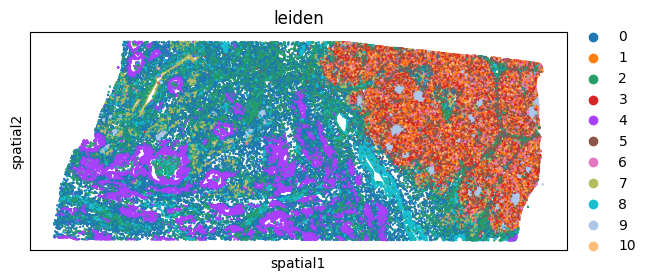

In [5]:
# Filter cells and genes
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)

# Derived data
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
    ],
    wspace=0.4,
)

# Write h5ad files
adata.write_h5ad(f'{data_dir}.h5ad')

## Get gdf_cell with cluster, spatial, and certain gene expressions

In [4]:
# Load h5ad file
adata = sc.read_h5ad(f'{data_dir}.h5ad')
adata.obs.set_index('cell_id', inplace=True)

# Extract gene expressions foro a gene list (handles sparse/dense matrices)
gene_list = ['EPCAM', 'AMY2A', 'GATM']

gene_exp = pd.DataFrame(
    data=adata[:, gene_list].X.toarray() if hasattr(adata.X, 'toarray') else adata[:, gene_list].X,
    columns=gene_list,
    index=adata.obs_names
)

# Create combined DataFrame with geometry
gdf_cell = gpd.GeoDataFrame(
    data={
        'cluster': adata.obs['leiden'],
        **gene_exp  # Unpacks all gene columns
    },
    geometry=[Point(xy) for xy in adata.obsm['spatial'][:, :2]],
    crs="EPSG:4326"  # Set your coordinate system here
)

gdf_cell['x'] = gdf_cell.geometry.x
gdf_cell['y'] = gdf_cell.geometry.y
gdf_cell = gdf_cell.reset_index()

## Load ROIs manually sketched in Celldega Landscape view

In [5]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_pixel.parquet')
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')

# Specify the polygon
roi_name = 'region_1'

# Select a ROI and calculate the distance from all cells to it

Extract the polygon for the specified ROI: region_1
Distances from points to polygon region_1 were calculated.
Plotting distances from points to polygon region_1...


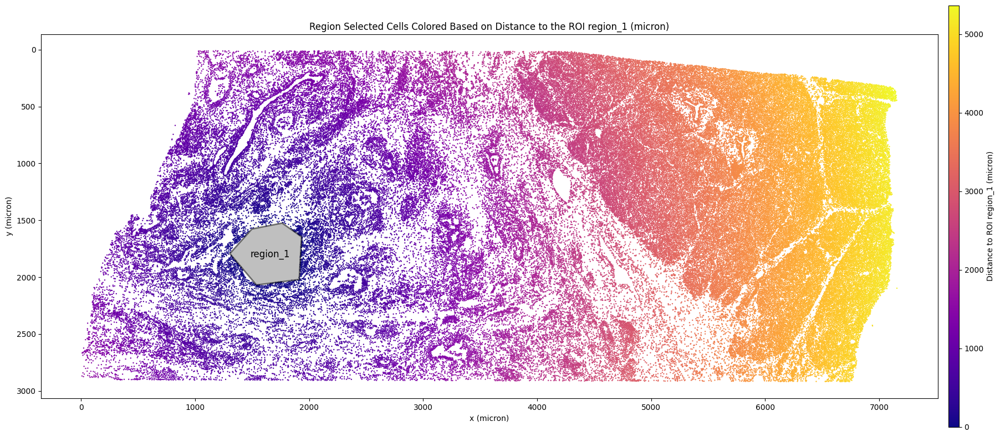

In [6]:
# Calculate distances
gdf_points_with_dist, gdf_polygon = dega.sp.calc_distance_to_roi(
    gdf_micron, 
    gdf_cell, 
    roi_name
)

# Plot distances
dega.sp.plot_distance_to_roi(
    gdf_points_with_dist, 
    gdf_polygon, 
    roi_name,
    markersize=0.5
)


In [ ]:

def calc_grad_nbhd_from_roi(polygon, gdf_reference, band_width):
    """
    Create concentric rings (buffers) around a given polygon.

    This function generates multiple concentric rings around a polygon by creating buffers
    at increasing distances from the original polygon. Each ring is defined by the area
    between two consecutive buffers.

    Parameters:
    polygon (shapely.geometry.Polygon): The polygon around which to create concentric rings.
    num_bands (int): The number of concentric rings to create.
    band_width (float): The width of each ring in the same units as the polygon.

    Returns:
    geopandas.GeoDataFrame: A GeoDataFrame containing the concentric rings as individual
                            geometries with a 'band' identifier for each ring. The GeoDataFrame
                            is set to the EPSG:4326 coordinate reference system.
    """
    band_list = []
    for i in range(1, 30 + 1):
        outer = polygon.buffer(i * band_width)
        inner = polygon.buffer((i - 1) * band_width)
        ring = outer.difference(inner)

        band = polygon.copy()
        band["geometry"] = ring
        band["band"] = i
        band_list.append(band)

    # Compare with the reference GeoDataFrame and only keep the ones that intersect
    band_list = [
        band[band.geometry.intersects(gdf_reference.unary_union)]
        for band in band_list
    ]
    
    return gpd.GeoDataFrame(pd.concat(band_list, ignore_index=True)).set_crs('EPSG:4326')

## Plot gene expression gradient along the distance to selected ROI

Complete calculating gene exp. gradient from points to region_1.
Plotting gene expression gradient from points to ROI region_1...


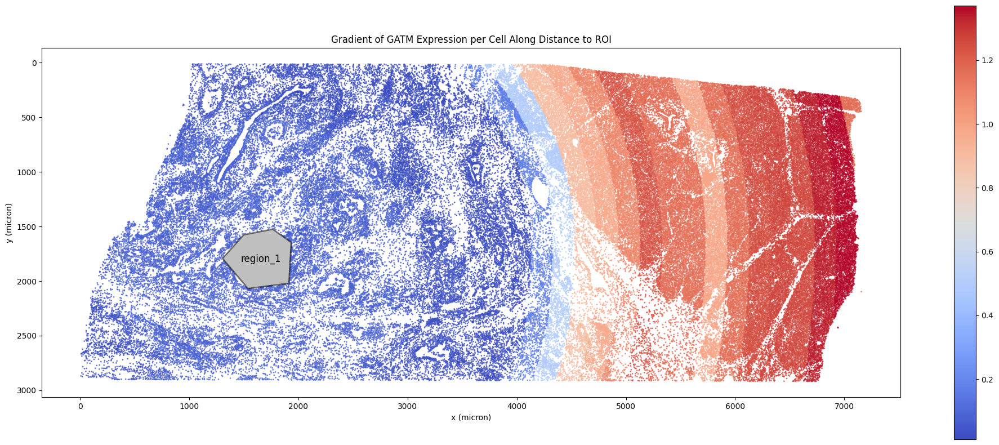

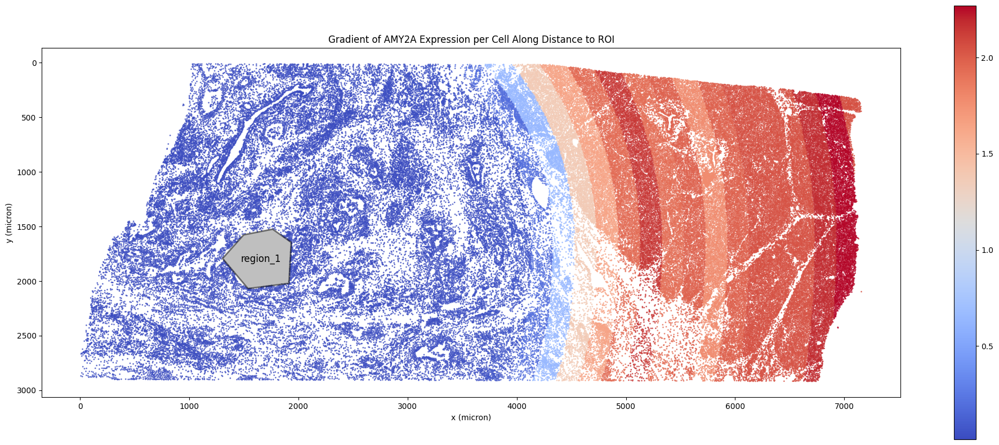

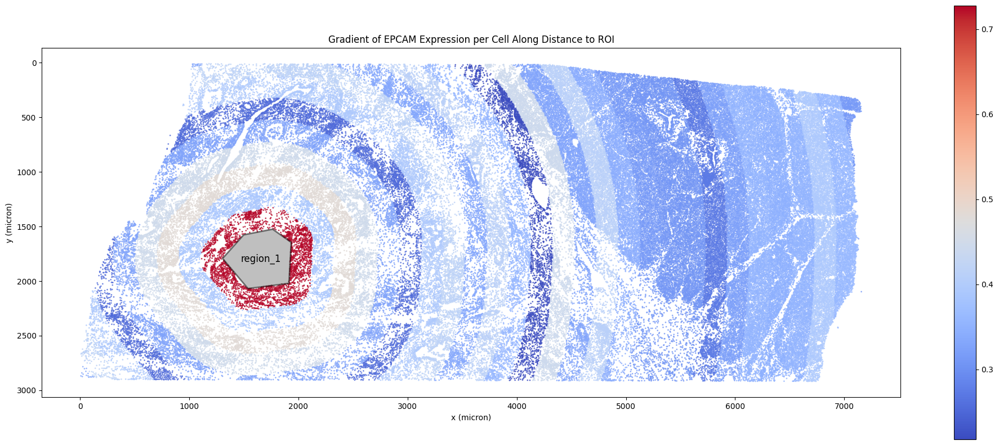

In [28]:

# Calculate gene gradients
band_width = 200

gdf_bands = calc_grad_nbhd_from_roi(gdf_polygon, gdf_points_with_dist, band_width)


gdf_join_all = dega.sp.calc_gene_expression_by_band(
    gdf_points_with_dist,
    gdf_bands,
    roi_name,
    band_width=band_width,
    gene_list=gene_list
)

# Plot gene gradients
dega.sp.plot_gene_gradient_to_roi(
    gdf_join_all,
    gdf_polygon,
    roi_name,
    gene_list=gene_list,
    markersize=1
)

# Save bands to Parquet
gradient_region_parquet_file_micron = f"{path_landscape_files}/gdf_{band_width}_um_bands_from_{roi_name}_micron.parquet"
gdf_bands.to_parquet(gradient_region_parquet_file_micron, engine="pyarrow")


